[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/GP248CME215/Kaggle-2D-Elastic-Wave/blob/main/training_model_FNO_colab.ipynb)





In [4]:
# Install missing packages (if any)
!pip install torch torchvision torchaudio tqdm
!pip install gdown

import numpy as np
import glob
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import tqdm
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
import torch.nn.functional as F
import re
device = 'cuda'  # Use GPU if available
# device = 'cpu'  # Use CPU if CUDA is not available

In [5]:
!gdown --id 16WqUax_QBzzeObSC0hb1Vq1Qf0NGuGz_
!gdown --id 1yrabALLeO-ka6AH0Hafq_H_lNPCQD49d

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=16WqUax_QBzzeObSC0hb1Vq1Qf0NGuGz_
From (redirected): https://drive.google.com/uc?id=16WqUax_QBzzeObSC0hb1Vq1Qf0NGuGz_&confirm=t&uuid=5ec908d9-e0ee-413a-86fe-aec972d03ce2
To: /content/training.zip
100% 1.84G/1.84G [00:23<00:00, 77.6MB/s]
/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1yrabALLeO-ka6AH0Hafq_H_lNPCQD49d
From (redirected): https://drive.google.com/uc?id=1yrabALLeO-ka6AH0Hafq_H_lNPCQD49d&confirm=t&uuid=d14891b8-2ef3-4caf-a654-87f334637d18
To: /content/test.zip
100

In [3]:
!unzip training.zip
!unzip test.zip

Archive:  training.zip
   creating: layered_simulation/
  inflating: layered_simulation/243.npy  
  inflating: layered_simulation/121.npy  
  inflating: layered_simulation/135.npy  
  inflating: layered_simulation/109.npy  
  inflating: layered_simulation/20.npy  
  inflating: layered_simulation/34.npy  
  inflating: layered_simulation/35.npy  
  inflating: layered_simulation/21.npy  
  inflating: layered_simulation/108.npy  
  inflating: layered_simulation/134.npy  
  inflating: layered_simulation/120.npy  
  inflating: layered_simulation/242.npy  
  inflating: layered_simulation/240.npy  
  inflating: layered_simulation/136.npy  
  inflating: layered_simulation/122.npy  
  inflating: layered_simulation/37.npy  
  inflating: layered_simulation/23.npy  
  inflating: layered_simulation/22.npy  
  inflating: layered_simulation/36.npy  
  inflating: layered_simulation/123.npy  
  inflating: layered_simulation/137.npy  
  inflating: layered_simulation/241.npy  
  inflating: layered_simulat

In [6]:
def plot_wavefield_video(wavefield_vx, wavefield_vz, save=False, title=None):
    """
    Visualize a 2D elastic wavefield as an animated video.
    Plots Vx and Vz components side by side over time.

    Parameters:
        wavefield_vx (ndarray): Wavefield component in x direction, shape (nt, nz, nx)
        wavefield_vz (ndarray): Wavefield component in z direction, shape (nt, nz, nx)
        save (bool): Whether to save the animation as a GIF
        title (str): Filename prefix for saving the animation (if save=True)

    Returns:
        HTML animation object (for Jupyter display)
    """
    # Extract time, vertical, and horizontal dimensions
    nt, nz, nx = wavefield_vx.shape

    # Set color scale limits based on max absolute wave amplitude (capped at 30%)
    vmax = np.max(np.abs([wavefield_vx, wavefield_vz])) * 0.3

    # Create side-by-side subplots for Vx and Vz
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Initialize first frame of Vx wavefield
    im0 = axes[0].imshow(wavefield_vx[0, :, :], cmap='seismic',
                         extent=[0, 128*20/1000, 64*20/1000, 0],
                         vmin=-vmax, vmax=vmax, animated=True)
    axes[0].set_title("Vx")
    axes[0].set_xlabel("X (km)")
    axes[0].set_ylabel("Z (km)")

    # Initialize first frame of Vz wavefield
    im1 = axes[1].imshow(wavefield_vz[0, :, :], cmap='seismic',
                         extent=[0, 128*20/1000, 64*20/1000, 0],
                         vmin=-vmax, vmax=vmax, animated=True)
    axes[1].set_title("Vz")
    axes[1].set_xlabel("X (km)")
    axes[1].set_ylabel("Z (km)")

    fig.tight_layout()

    # Frame update function for animation
    def update(frame):
        im0.set_array(wavefield_vx[frame, :, :])
        im1.set_array(wavefield_vz[frame, :, :])
        return [im0, im1]

    # Create animation
    anim = FuncAnimation(fig, update, frames=nt, interval=50, blit=True)
    plt.close(fig)

    # Optionally save as GIF
    if save:
        anim.save(f'{title}.gif', fps=10)

    # Display inline in Jupyter
    return HTML(anim.to_jshtml())


def plot_wavefield_video_pred_gt(wavefield_vx, wavefield_vz, wavefield_vx_Y, wavefield_vz_Y, save=False, title=None):
    """
    Compare predicted and ground truth 2D elastic wavefields in an animation.
    Displays Vx and Vz for both prediction and ground truth in a 2×2 subplot.

    Parameters:
        wavefield_vx (ndarray): Predicted Vx component, shape (nt, nz, nx)
        wavefield_vz (ndarray): Predicted Vz component, shape (nt, nz, nx)
        wavefield_vx_Y (ndarray): Ground truth Vx component, shape (nt, nz, nx)
        wavefield_vz_Y (ndarray): Ground truth Vz component, shape (nt, nz, nx)
        save (bool): Whether to save the animation as a GIF
        title (str): Filename prefix for saving the animation (if save=True)

    Returns:
        HTML animation object (for Jupyter display)
    """
    # Dimensions of wavefield arrays
    nt, nz, nx = wavefield_vx.shape

    # Determine dynamic color scale limit
    vmax = np.max(np.abs([wavefield_vx, wavefield_vz])) * 0.3

    # Create 2x2 subplot layout: prediction (top), ground truth (bottom)
    fig, axes = plt.subplots(2, 2, figsize=(14, 9))

    # Plot predicted Vx
    im0 = axes[0, 0].imshow(wavefield_vx[0, :, :], cmap='seismic',
                            extent=[0, 128*20/1000, 64*20/1000, 0],
                            vmin=-vmax, vmax=vmax, animated=True)
    axes[0, 0].set_title("Vx prediction")
    axes[0, 0].set_xlabel("X (km)")
    axes[0, 0].set_ylabel("Z (km)")

    # Plot predicted Vz
    im1 = axes[0, 1].imshow(wavefield_vz[0, :, :], cmap='seismic',
                            extent=[0, 128*20/1000, 64*20/1000, 0],
                            vmin=-vmax, vmax=vmax, animated=True)
    axes[0, 1].set_title("Vz prediction")
    axes[0, 1].set_xlabel("X (km)")
    axes[0, 1].set_ylabel("Z (km)")

    # Plot ground truth Vx
    im2 = axes[1, 0].imshow(wavefield_vx_Y[0, :, :], cmap='seismic',
                            extent=[0, 128*20/1000, 64*20/1000, 0],
                            vmin=-vmax, vmax=vmax, animated=True)
    axes[1, 0].set_title("Vx ground truth")
    axes[1, 0].set_xlabel("X (km)")
    axes[1, 0].set_ylabel("Z (km)")

    # Plot ground truth Vz
    im3 = axes[1, 1].imshow(wavefield_vz_Y[0, :, :], cmap='seismic',
                            extent=[0, 128*20/1000, 64*20/1000, 0],
                            vmin=-vmax, vmax=vmax, animated=True)
    axes[1, 1].set_title("Vz ground truth")
    axes[1, 1].set_xlabel("X (km)")
    axes[1, 1].set_ylabel("Z (km)")

    fig.tight_layout()

    # Update function for all four subplots
    def update(frame):
        im0.set_array(wavefield_vx[frame, :, :])
        im1.set_array(wavefield_vz[frame, :, :])
        im2.set_array(wavefield_vx_Y[frame, :, :])
        im3.set_array(wavefield_vz_Y[frame, :, :])
        return [im0, im1, im2, im3]

    # Create the animation
    anim = FuncAnimation(fig, update, frames=nt, interval=50, blit=True)
    plt.close(fig)

    # Save as gif if requested
    if save:
        anim.save(f'{title}.gif', fps=10)

    # Display inline
    return HTML(anim.to_jshtml())


In [7]:
### LOAD ALL THE DATA FOR TRAINING + VALIDATION

# Gather all file paths from two directories: layered and random field simulations.
# Each file is assumed to represent one simulation sample.
all_waveforms = glob.glob('./layered_simulation/*') + glob.glob('./random_field_simulation/*')

### To avoid crashing the RAM, we only use a quarter of the dataset
all_waveforms = all_waveforms[::2]
number_of_samples = len(all_waveforms)
print('Number of samples for training and validation ', number_of_samples)

Number of samples for training and validation  125


# VISUALIZE DATA

Each .npy file in the folder contains a dictionary of physical and simulation parameters and partial wavefield data from a 2D elastic wave propagation simulation

| Key               | Shape / Type          | Description |
|-------------------|------------------------|-------------|
| `'ox'`, `'oz'`    | `float`                | Origin of the model (x, z = 0.0) |
| `'dx'`, `'dz'`    | `float`                | Grid spacing in x and z (20.0 m) |
| `'nx'`, `'nz'`    | `int`                  | Number of grid points (128 × 64) |
| `'nt'`            | `int`                  | Number of time steps (60) |
| `'dt'`            | `float`                | Time step size (0.03 s) |
| `'f0'`            | `float`                | Dominant source frequency (Hz) |
| `'amp'`           | `float`                | Source amplitude |
| `'source_loc'`    | `list[float]`          | Earthquake source location `[x, z]` |
| `'focal_mechanism'` | `list[float]`        | `[strike, dip, rake]` angles of the source |
| `'free_surface'`  | `bool`                 | Whether free-surface boundary is used |
| `'vp'`, `'vs'`, `'rho'` | `np.ndarray (64×128)` | P-wave, S-wave velocities (in m/s), and density (kg/m³) |
| `'wavefield_vx'`, `'wavefield_vz'` | `np.ndarray (60×64×128)` | Simulated wavefields in x and z directions — only **first 15 time steps** saved for prediction tasks |

In [8]:
# Select a sample index to visualize
id_2_show = 0

# Load the .npy file containing simulation data
sample_2_show = np.load(all_waveforms[id_2_show], allow_pickle=True)

wavefield_vx = sample_2_show.item().get('wavefield_vx') # Extract the x-direction wavefield (shape: [15, 64, 128])
wavefield_vz = sample_2_show.item().get('wavefield_vz') # Extract the z-direction wavefield (shape: [15, 64, 128])
vp = sample_2_show.item().get('vp') # Extract the P-wave velocity field (Vp) [64×128], in m/s
vs = sample_2_show.item().get('vs') # Extract the S-wave velocity field (Vs) [64×128], in m/s
foc_x, foc_z = sample_2_show.item().get('source_loc') # Get the source (focal) location in meters

# Plot and save an animated video of the wavefield (Vx and Vz components)
plot_wavefield_video(wavefield_vx, wavefield_vz, save=True, title='wavefield')

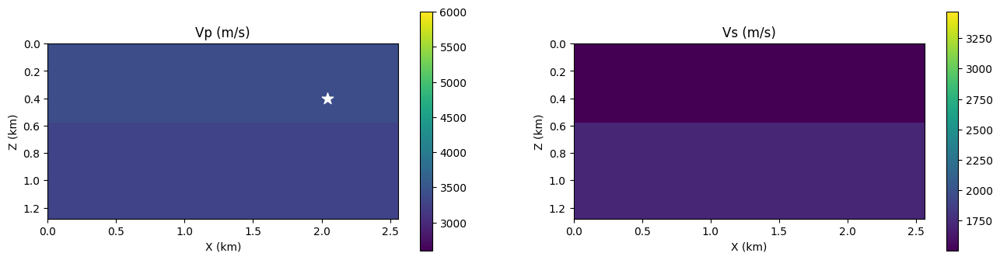

In [9]:
# Create a figure with 2 side-by-side subplots to show Vp and Vs models
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(16, 4))
# Plot Vp field (colorbar in m/s)
cbar1 = axes[0].imshow(vp, extent=[0, 128*20/1000, 64*20/1000, 0],
                       vmin=2600, vmax=6000)
axes[0].set_title('Vp (m/s)')
axes[0].set_xlabel('X (km)')
axes[0].set_ylabel('Z (km)')
# Plot Vs field (colorbar scaled accordingly)
cbar2 = axes[1].imshow(vs, extent=[0, 128*20/1000, 64*20/1000, 0],
                       vmin=2600/1.73, vmax=6000/1.73)
axes[1].set_title('Vs (m/s)')
axes[1].set_xlabel('X (km)')
axes[1].set_ylabel('Z (km)')
# Overlay focal source location on Vp plot
axes[0].scatter(foc_x / 1000, foc_z / 1000, marker='*',
                s=120, color='white', label='Focal Center')
# Add colorbars to both subplots
fig.colorbar(cbar1, ax=axes[0])
fig.colorbar(cbar2, ax=axes[1])
plt.show()

# Data Preparation

In [10]:
# Define grid and time dimensions
nx = 128       # number of grid points in x-direction
nz = 64        # number of grid points in z-direction
nt = 60        # number of time steps in each wavefield

# Preallocate arrays to store all data
# all_wavefield: shape (n_samples, nt, nz, nx, 2) for vx and vz components
all_wavefield = np.zeros((number_of_samples, nt, nz, nx, 2))

# all_vp and all_vs: shape (n_samples, nz, nx) for P-wave and S-wave velocities
all_vp = np.zeros((number_of_samples, nz, nx))
all_vs = np.zeros((number_of_samples, nz, nx))

# Loop over each saved waveform file and populate the data arrays
for i, one_wf_path in enumerate(all_waveforms):
    sample = np.load(one_wf_path, allow_pickle=True)  # Load .npy file as dictionary

    # Extract vx and vz wavefield components
    wavefield_vx = sample.item().get('wavefield_vx')  # shape: (nt, nz, nx)
    wavefield_vz = sample.item().get('wavefield_vz')  # shape: (nt, nz, nx)

    # Extract velocity models
    vp = sample.item().get('vp')  # shape: (nz, nx)
    vs = sample.item().get('vs')  # shape: (nz, nx)

    # Assign to preallocated arrays
    all_vp[i] = vp
    all_vs[i] = vs
    all_wavefield[i, :, :, :, 0] = wavefield_vx
    all_wavefield[i, :, :, :, 1] = wavefield_vz

# Define a normalization function (standard score)
def normalize(data):
    mean = np.mean(data)
    std = np.std(data)
    standardized_data_numpy = (data - mean) / std
    return standardized_data_numpy, mean, std

# Normalize the wavefield data (standardization over entire dataset)
all_wavefield, wavefield_mean, wavefield_std = normalize(all_wavefield)
all_vs, vs_mean, vs_std = normalize(all_vs)
all_vp, vp_mean, vp_std = normalize(all_vp)

In [11]:
np.random.seed(0)

# Randomly select 80% of the indices to use for training (no replacement)
train_idx = np.random.choice(len(all_wavefield), int(len(all_wavefield) * 0.8), replace=False)
# The remaining 20% of indices are used for validation
val_idx = list(set(np.arange(0, len(all_wavefield)).tolist()) - set(train_idx))

# Slice the wavefield and velocity data into training and validation sets
train_wavefield = all_wavefield[train_idx]  # shape: (N_train, nt, nz, nx, 2)
train_vp = all_vp[train_idx]                # shape: (N_train, nz, nx)
train_vs = all_vs[train_idx]                # shape: (N_train, nz, nx)

val_wavefield  = all_wavefield[val_idx]     # shape: (N_val, nt, nz, nx, 2)
val_vp  = all_vp[val_idx]                   # shape: (N_val, nz, nx)
val_vs  = all_vs[val_idx]                   # shape: (N_val, nz, nx)

# Print the resulting shapes to verify the split
print(train_wavefield.shape, val_wavefield.shape)

(100, 60, 64, 128, 2) (25, 60, 64, 128, 2)


In [12]:
# Prepare training data: create input-output pairs for one-step wavefield prediction
# Inputs: [vx_t, vz_t, vp, vs]; Output: [vx_{t+1}, vz_{t+1}]
X_list_train, Y_list_train = [], []

# Loop over time steps (starting from t=12 to exclude early wavefront buildup)
for t in tqdm.tqdm(range(12, train_wavefield.shape[1] - 1)):
    w_t = train_wavefield[:, t]        # Current wavefield at time t (shape: N, 64, 128, 2)
    w_tp1 = train_wavefield[:, t + 1]  # Target wavefield at next time step (t+1)

    vp_ = train_vp[:, :, :, None]      # Expand vp to (N, 64, 128, 1) for channel concatenation
    vs_ = train_vs[:, :, :, None]      # Expand vs to (N, 64, 128, 1)

    # Combine wavefield at t with static velocity model (vp, vs) → (N, 64, 128, 4)
    X = np.concatenate([w_t, vp_, vs_], axis=-1)

    X_list_train.append(X)
    Y_list_train.append(w_tp1)

# Stack all time steps into a single training dataset
X_train = np.concatenate(X_list_train, axis=0)  # Shape: (N_train * T, 64, 128, 4)
Y_train = np.concatenate(Y_list_train, axis=0)  # Shape: (N_train * T, 64, 128, 2)


# Prepare validation data in the same way
X_list_val, Y_list_val = [], []

for t in tqdm.tqdm(range(12, val_wavefield.shape[1] - 1)):
    w_t = val_wavefield[:, t]
    w_tp1 = val_wavefield[:, t + 1]
    vp_ = val_vp[:, :, :, None]
    vs_ = val_vs[:, :, :, None]
    X = np.concatenate([w_t, vp_, vs_], axis=-1)
    X_list_val.append(X)
    Y_list_val.append(w_tp1)

X_val = np.concatenate(X_list_val, axis=0)  # Shape: (N_val * T, 64, 128, 4)
Y_val = np.concatenate(Y_list_val, axis=0)  # Shape: (N_val * T, 64, 128, 2)

train_loader = DataLoader(
    TensorDataset(torch.tensor(X_train, dtype=torch.float32),
                  torch.tensor(Y_train, dtype=torch.float32)),
    batch_size=16,
    shuffle=True
)

val_loader = DataLoader(
    TensorDataset(torch.tensor(X_val, dtype=torch.float32),
                  torch.tensor(Y_val, dtype=torch.float32)),
    batch_size=64,
    shuffle=False
)

100%|██████████| 47/47 [00:00<00:00, 98.87it/s]


In [13]:
class SpectralConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, modes1, modes2):
        super(SpectralConv2d, self).__init__()
        """
        2D Fourier layer for the FNO.
        Performs: FFT → complex linear transform in frequency domain → inverse FFT.
        Only a subset of the lowest-frequency Fourier modes are retained.
        """

        self.in_channels = in_channels
        self.out_channels = out_channels
        self.modes1 = modes1  # Number of Fourier modes in height direction
        self.modes2 = modes2  # Number of Fourier modes in width direction

        # Scale factor for initialization
        self.scale = 1 / (in_channels * out_channels)

        # Learnable complex-valued weights for selected Fourier modes
        self.weights1 = nn.Parameter(self.scale * torch.rand(in_channels, out_channels, self.modes1, self.modes2, dtype=torch.cfloat))
        self.weights2 = nn.Parameter(self.scale * torch.rand(in_channels, out_channels, self.modes1, self.modes2, dtype=torch.cfloat))

    def compl_mul2d(self, input, weights):
        """
        Perform complex multiplication using Einstein summation.
        Input: (B, in_channels, H, W_freq), Weights: (in_channels, out_channels, H, W_freq)
        Output: (B, out_channels, H, W_freq)
        """
        return torch.einsum("bixy,ioxy->boxy", input, weights)

    def forward(self, x):
        # x: (B, in_channels, H, W), spatial domain
        batchsize = x.shape[0]

        # Apply 2D FFT to convert to frequency domain
        x_ft = torch.fft.rfft2(x)

        # Allocate zero output in Fourier domain (only for selected modes)
        out_ft = torch.zeros(batchsize, self.out_channels, x.size(-2), x.size(-1)//2 + 1,
                             dtype=torch.cfloat, device=x.device)

        # Multiply selected low-frequency modes with learnable complex weights
        out_ft[:, :, :self.modes1, :self.modes2] = self.compl_mul2d(
            x_ft[:, :, :self.modes1, :self.modes2], self.weights1)
        out_ft[:, :, -self.modes1:, :self.modes2] = self.compl_mul2d(
            x_ft[:, :, -self.modes1:, :self.modes2], self.weights2)

        # Inverse FFT to return to spatial domain
        x = torch.fft.irfft2(out_ft, s=(x.size(-2), x.size(-1)))
        return x


class FNO2d(nn.Module):
    def __init__(self, modes1, modes2, width, input_channel=6, output_channel=2):
        super(FNO2d, self).__init__()
        """
        2D Fourier Neural Operator (FNO) model.
        Architecture:
        1. Lift input to high-dimensional space using fc0.
        2. Apply 4 Fourier-integral layers (spectral convolution + pointwise conv).
        3. Project back to 2-channel output (vx, vz) using fc1 and fc2.
        """

        self.modes1 = modes1  # number of Fourier modes in height
        self.modes2 = modes2  # number of Fourier modes in width
        self.width = width    # number of channels/features in hidden layers
        self.padding = 12     # pad to reduce edge artifacts (for non-periodic BCs)

        # Input lifting layer: from 6-channel input to internal width
        # Input channels: [vx, vz, vp, vs, x_coord, y_coord]
        self.fc0 = nn.Linear(input_channel, self.width)

        # 4 layers of spectral + pointwise convolution blocks
        self.conv0 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv1 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv2 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv3 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)

        self.w0 = nn.Conv2d(self.width, self.width, 1)  # Pointwise conv for residual
        self.w1 = nn.Conv2d(self.width, self.width, 1)
        self.w2 = nn.Conv2d(self.width, self.width, 1)
        self.w3 = nn.Conv2d(self.width, self.width, 1)

        # Final projection layers: width → 32 → 2
        self.fc1 = nn.Linear(self.width, 32)
        self.fc2 = nn.Linear(32, output_channel)  # Output 2 components: vx and vz

    def forward(self, x):
        # Add normalized spatial coordinates as input channels
        grid = self.get_grid(x.shape, x.device)  # shape: (B, H, W, 2)
        x = torch.cat((x, grid), dim=-1)         # now x has 6 channels

        # Project to hidden width dimension
        x = self.fc0(x)                           # (B, H, W, width)
        x = x.permute(0, 3, 1, 2)                 # (B, width, H, W)

        # Pad for better boundary behavior
        x = F.pad(x, [0, self.padding, 0, self.padding])

        # 4 spectral layers with GELU activation
        x = F.gelu(self.conv0(x) + self.w0(x))
        x = F.gelu(self.conv1(x) + self.w1(x))
        x = F.gelu(self.conv2(x) + self.w2(x))
        x = self.conv3(x) + self.w3(x)

        # Remove padding
        x = x[..., :-self.padding, :-self.padding]

        # Project back to original spatial layout
        x = x.permute(0, 2, 3, 1)  # (B, H, W, width)
        x = F.gelu(self.fc1(x))
        x = self.fc2(x)            # Final output: (B, H, W, 2)
        return x

    def get_grid(self, shape, device):
        """
        Generate normalized [0,1] grid of x and y coordinates to provide positional context.
        Output shape: (B, H, W, 2)
        """
        batchsize, size_x, size_y = shape[0], shape[1], shape[2]
        gridx = torch.linspace(0, 1, size_x, device=device).reshape(1, size_x, 1, 1).repeat(batchsize, 1, size_y, 1)
        gridy = torch.linspace(0, 1, size_y, device=device).reshape(1, 1, size_y, 1).repeat(batchsize, size_x, 1, 1)
        return torch.cat((gridx, gridy), dim=-1)


In [15]:
# ----------- Hyperparameters -----------
epochs = 100                  # Total number of training epochs
lr = 2e-3                     # Initial learning rate

# ----------- Model, Optimizer, and Scheduler -----------
model = FNO2d(modes1=7, modes2=14, width=8).to(device)  # Initialize FNO model

optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

# ----------- Loss Function and Tracking -----------
criterion = nn.MSELoss()
train_losses, val_losses = [], []

# ----------- Training Loop -----------
for epoch in tqdm.tqdm(range(epochs), desc='Training'):
    model.train()
    running_train_loss = 0.0

    for x_batch, y_batch in train_loader:
        x_batch, y_batch = x_batch.to(device), y_batch.to(device)

        optimizer.zero_grad()
        preds = model(x_batch).reshape(-1, nz, nx, 2)  # Reshape to match label shape
        loss = criterion(preds.view(len(x_batch), -1), y_batch.view(len(y_batch), -1))
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item()

    scheduler.step()  # Adjust learning rate

    # ----------- Validation Loop -----------
    model.eval()
    running_val_loss = 0.0

    with torch.no_grad():
        for x_val, y_val in val_loader:
            x_val, y_val = x_val.to(device), y_val.to(device)
            preds = model(x_val).reshape(-1, nz, nx, 2)
            loss = criterion(preds.view(len(x_val), -1), y_val.view(len(y_val), -1))
            running_val_loss += loss.item()

    # Average losses for the epoch
    avg_train_loss = running_train_loss / len(train_loader)
    avg_val_loss = running_val_loss / len(val_loader)

    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)

    # Progress display
    print(f"Epoch {epoch+1:03d} | Train Loss: {avg_train_loss:.6f} | Val Loss: {avg_val_loss:.6f}")


Training:   1%|          | 1/100 [00:05<09:14,  5.60s/it]

Epoch 001 | Train Loss: 0.616010 | Val Loss: 0.320679


Training:   2%|▏         | 2/100 [00:10<08:03,  4.93s/it]

Epoch 002 | Train Loss: 0.229601 | Val Loss: 0.235666


Training:   3%|▎         | 3/100 [00:14<07:45,  4.80s/it]

Epoch 003 | Train Loss: 0.168398 | Val Loss: 0.220787


Training:   4%|▍         | 4/100 [00:19<07:37,  4.77s/it]

Epoch 004 | Train Loss: 0.142086 | Val Loss: 0.195345


Training:   5%|▌         | 5/100 [00:23<07:20,  4.64s/it]

Epoch 005 | Train Loss: 0.126526 | Val Loss: 0.181551


Training:   6%|▌         | 6/100 [00:28<07:17,  4.65s/it]

Epoch 006 | Train Loss: 0.115806 | Val Loss: 0.185268


Training:   7%|▋         | 7/100 [00:32<07:04,  4.57s/it]

Epoch 007 | Train Loss: 0.107372 | Val Loss: 0.166174


Training:   8%|▊         | 8/100 [00:37<06:58,  4.55s/it]

Epoch 008 | Train Loss: 0.100189 | Val Loss: 0.164676


Training:   9%|▉         | 9/100 [00:41<06:53,  4.54s/it]

Epoch 009 | Train Loss: 0.095945 | Val Loss: 0.157017


Training:  10%|█         | 10/100 [00:46<06:43,  4.49s/it]

Epoch 010 | Train Loss: 0.091796 | Val Loss: 0.150894


Training:  11%|█         | 11/100 [00:50<06:44,  4.55s/it]

Epoch 011 | Train Loss: 0.088020 | Val Loss: 0.156306


Training:  12%|█▏        | 12/100 [00:55<06:35,  4.49s/it]

Epoch 012 | Train Loss: 0.086097 | Val Loss: 0.146417


Training:  13%|█▎        | 13/100 [00:59<06:27,  4.45s/it]

Epoch 013 | Train Loss: 0.083914 | Val Loss: 0.148165


Training:  14%|█▍        | 14/100 [01:04<06:27,  4.51s/it]

Epoch 014 | Train Loss: 0.080577 | Val Loss: 0.145988


Training:  15%|█▌        | 15/100 [01:08<06:19,  4.46s/it]

Epoch 015 | Train Loss: 0.078326 | Val Loss: 0.148251


Training:  16%|█▌        | 16/100 [01:13<06:14,  4.46s/it]

Epoch 016 | Train Loss: 0.076699 | Val Loss: 0.141844


Training:  17%|█▋        | 17/100 [01:17<06:12,  4.49s/it]

Epoch 017 | Train Loss: 0.074967 | Val Loss: 0.143255


Training:  18%|█▊        | 18/100 [01:22<06:05,  4.46s/it]

Epoch 018 | Train Loss: 0.073720 | Val Loss: 0.140088


Training:  19%|█▉        | 19/100 [01:26<06:05,  4.51s/it]

Epoch 019 | Train Loss: 0.072640 | Val Loss: 0.137189


Training:  20%|██        | 20/100 [01:31<05:57,  4.46s/it]

Epoch 020 | Train Loss: 0.071081 | Val Loss: 0.134905


Training:  21%|██        | 21/100 [01:35<05:50,  4.44s/it]

Epoch 021 | Train Loss: 0.070784 | Val Loss: 0.135149


Training:  22%|██▏       | 22/100 [01:40<05:50,  4.49s/it]

Epoch 022 | Train Loss: 0.068532 | Val Loss: 0.132131


Training:  23%|██▎       | 23/100 [01:44<05:43,  4.46s/it]

Epoch 023 | Train Loss: 0.067737 | Val Loss: 0.131596


Training:  24%|██▍       | 24/100 [01:48<05:37,  4.44s/it]

Epoch 024 | Train Loss: 0.066253 | Val Loss: 0.133845


Training:  25%|██▌       | 25/100 [01:53<05:36,  4.49s/it]

Epoch 025 | Train Loss: 0.065945 | Val Loss: 0.131806


Training:  26%|██▌       | 26/100 [01:57<05:30,  4.46s/it]

Epoch 026 | Train Loss: 0.065712 | Val Loss: 0.130366


Training:  27%|██▋       | 27/100 [02:02<05:27,  4.48s/it]

Epoch 027 | Train Loss: 0.063940 | Val Loss: 0.144876


Training:  28%|██▊       | 28/100 [02:06<05:21,  4.47s/it]

Epoch 028 | Train Loss: 0.063973 | Val Loss: 0.130193


Training:  29%|██▉       | 29/100 [02:11<05:14,  4.43s/it]

Epoch 029 | Train Loss: 0.062274 | Val Loss: 0.124358


Training:  30%|███       | 30/100 [02:15<05:14,  4.49s/it]

Epoch 030 | Train Loss: 0.061627 | Val Loss: 0.122955


Training:  31%|███       | 31/100 [02:20<05:07,  4.46s/it]

Epoch 031 | Train Loss: 0.061121 | Val Loss: 0.128017


Training:  32%|███▏      | 32/100 [02:24<05:01,  4.43s/it]

Epoch 032 | Train Loss: 0.060285 | Val Loss: 0.127852


Training:  33%|███▎      | 33/100 [02:29<05:01,  4.50s/it]

Epoch 033 | Train Loss: 0.060086 | Val Loss: 0.122826


Training:  34%|███▍      | 34/100 [02:33<04:54,  4.46s/it]

Epoch 034 | Train Loss: 0.059846 | Val Loss: 0.126189


Training:  35%|███▌      | 35/100 [02:38<04:49,  4.46s/it]

Epoch 035 | Train Loss: 0.058454 | Val Loss: 0.126059


Training:  36%|███▌      | 36/100 [02:42<04:47,  4.49s/it]

Epoch 036 | Train Loss: 0.057873 | Val Loss: 0.124864


Training:  37%|███▋      | 37/100 [02:46<04:41,  4.46s/it]

Epoch 037 | Train Loss: 0.057678 | Val Loss: 0.128713


Training:  38%|███▊      | 38/100 [02:51<04:41,  4.54s/it]

Epoch 038 | Train Loss: 0.056656 | Val Loss: 0.122580


Training:  39%|███▉      | 39/100 [02:56<04:33,  4.49s/it]

Epoch 039 | Train Loss: 0.056201 | Val Loss: 0.125331


Training:  40%|████      | 40/100 [03:00<04:27,  4.46s/it]

Epoch 040 | Train Loss: 0.055853 | Val Loss: 0.121782


Training:  41%|████      | 41/100 [03:05<04:27,  4.54s/it]

Epoch 041 | Train Loss: 0.055116 | Val Loss: 0.123056


Training:  42%|████▏     | 42/100 [03:09<04:20,  4.48s/it]

Epoch 042 | Train Loss: 0.054578 | Val Loss: 0.124515


Training:  43%|████▎     | 43/100 [03:14<04:15,  4.48s/it]

Epoch 043 | Train Loss: 0.054052 | Val Loss: 0.120518


Training:  44%|████▍     | 44/100 [03:18<04:11,  4.50s/it]

Epoch 044 | Train Loss: 0.054063 | Val Loss: 0.124836


Training:  45%|████▌     | 45/100 [03:22<04:05,  4.46s/it]

Epoch 045 | Train Loss: 0.053484 | Val Loss: 0.121851


Training:  46%|████▌     | 46/100 [03:27<04:04,  4.52s/it]

Epoch 046 | Train Loss: 0.052842 | Val Loss: 0.120009


Training:  47%|████▋     | 47/100 [03:31<03:57,  4.48s/it]

Epoch 047 | Train Loss: 0.052315 | Val Loss: 0.120442


Training:  48%|████▊     | 48/100 [03:36<03:51,  4.45s/it]

Epoch 048 | Train Loss: 0.051835 | Val Loss: 0.119170


Training:  49%|████▉     | 49/100 [03:41<03:50,  4.51s/it]

Epoch 049 | Train Loss: 0.051078 | Val Loss: 0.120630


Training:  50%|█████     | 50/100 [03:45<03:43,  4.47s/it]

Epoch 050 | Train Loss: 0.051234 | Val Loss: 0.117374


Training:  51%|█████     | 51/100 [03:49<03:38,  4.46s/it]

Epoch 051 | Train Loss: 0.050896 | Val Loss: 0.127868


Training:  52%|█████▏    | 52/100 [03:54<03:35,  4.49s/it]

Epoch 052 | Train Loss: 0.050710 | Val Loss: 0.121190


Training:  53%|█████▎    | 53/100 [03:58<03:29,  4.46s/it]

Epoch 053 | Train Loss: 0.049780 | Val Loss: 0.119582


Training:  54%|█████▍    | 54/100 [04:03<03:26,  4.48s/it]

Epoch 054 | Train Loss: 0.049423 | Val Loss: 0.118455


Training:  55%|█████▌    | 55/100 [04:07<03:21,  4.48s/it]

Epoch 055 | Train Loss: 0.048933 | Val Loss: 0.125549


Training:  56%|█████▌    | 56/100 [04:12<03:15,  4.44s/it]

Epoch 056 | Train Loss: 0.048670 | Val Loss: 0.118013


Training:  57%|█████▋    | 57/100 [04:16<03:13,  4.51s/it]

Epoch 057 | Train Loss: 0.048476 | Val Loss: 0.121548


Training:  58%|█████▊    | 58/100 [04:21<03:07,  4.47s/it]

Epoch 058 | Train Loss: 0.047810 | Val Loss: 0.118264


Training:  59%|█████▉    | 59/100 [04:25<03:02,  4.45s/it]

Epoch 059 | Train Loss: 0.047632 | Val Loss: 0.117631


Training:  60%|██████    | 60/100 [04:30<03:00,  4.50s/it]

Epoch 060 | Train Loss: 0.047207 | Val Loss: 0.117563


Training:  61%|██████    | 61/100 [04:34<02:53,  4.46s/it]

Epoch 061 | Train Loss: 0.047045 | Val Loss: 0.118806


Training:  62%|██████▏   | 62/100 [04:39<02:49,  4.47s/it]

Epoch 062 | Train Loss: 0.047035 | Val Loss: 0.116544


Training:  63%|██████▎   | 63/100 [04:43<02:45,  4.48s/it]

Epoch 063 | Train Loss: 0.046414 | Val Loss: 0.115088


Training:  64%|██████▍   | 64/100 [04:47<02:40,  4.46s/it]

Epoch 064 | Train Loss: 0.045978 | Val Loss: 0.115847


Training:  65%|██████▌   | 65/100 [04:52<02:38,  4.52s/it]

Epoch 065 | Train Loss: 0.045717 | Val Loss: 0.120420


Training:  66%|██████▌   | 66/100 [04:57<02:32,  4.48s/it]

Epoch 066 | Train Loss: 0.045534 | Val Loss: 0.116976


Training:  67%|██████▋   | 67/100 [05:01<02:26,  4.44s/it]

Epoch 067 | Train Loss: 0.045205 | Val Loss: 0.117026


Training:  68%|██████▊   | 68/100 [05:06<02:24,  4.50s/it]

Epoch 068 | Train Loss: 0.044977 | Val Loss: 0.113893


Training:  69%|██████▉   | 69/100 [05:10<02:18,  4.47s/it]

Epoch 069 | Train Loss: 0.044710 | Val Loss: 0.115137


Training:  70%|███████   | 70/100 [05:14<02:14,  4.47s/it]

Epoch 070 | Train Loss: 0.044530 | Val Loss: 0.114530


Training:  71%|███████   | 71/100 [05:19<02:10,  4.51s/it]

Epoch 071 | Train Loss: 0.044217 | Val Loss: 0.115811


Training:  72%|███████▏  | 72/100 [05:23<02:05,  4.47s/it]

Epoch 072 | Train Loss: 0.043951 | Val Loss: 0.115486


Training:  73%|███████▎  | 73/100 [05:28<02:02,  4.53s/it]

Epoch 073 | Train Loss: 0.043841 | Val Loss: 0.114971


Training:  74%|███████▍  | 74/100 [05:32<01:56,  4.48s/it]

Epoch 074 | Train Loss: 0.043553 | Val Loss: 0.115913


Training:  75%|███████▌  | 75/100 [05:37<01:51,  4.44s/it]

Epoch 075 | Train Loss: 0.043425 | Val Loss: 0.116213


Training:  76%|███████▌  | 76/100 [05:41<01:48,  4.51s/it]

Epoch 076 | Train Loss: 0.043207 | Val Loss: 0.116731


Training:  77%|███████▋  | 77/100 [05:46<01:42,  4.46s/it]

Epoch 077 | Train Loss: 0.043039 | Val Loss: 0.116477


Training:  78%|███████▊  | 78/100 [05:50<01:38,  4.47s/it]

Epoch 078 | Train Loss: 0.042782 | Val Loss: 0.116824


Training:  79%|███████▉  | 79/100 [05:55<01:34,  4.50s/it]

Epoch 079 | Train Loss: 0.042683 | Val Loss: 0.115132


Training:  80%|████████  | 80/100 [05:59<01:29,  4.46s/it]

Epoch 080 | Train Loss: 0.042467 | Val Loss: 0.114347


Training:  81%|████████  | 81/100 [06:04<01:25,  4.51s/it]

Epoch 081 | Train Loss: 0.042355 | Val Loss: 0.116581


Training:  82%|████████▏ | 82/100 [06:08<01:20,  4.47s/it]

Epoch 082 | Train Loss: 0.042182 | Val Loss: 0.115536


Training:  83%|████████▎ | 83/100 [06:13<01:15,  4.44s/it]

Epoch 083 | Train Loss: 0.042065 | Val Loss: 0.115276


Training:  84%|████████▍ | 84/100 [06:17<01:12,  4.50s/it]

Epoch 084 | Train Loss: 0.041929 | Val Loss: 0.114853


Training:  85%|████████▌ | 85/100 [06:22<01:06,  4.46s/it]

Epoch 085 | Train Loss: 0.041821 | Val Loss: 0.114696


Training:  86%|████████▌ | 86/100 [06:26<01:02,  4.45s/it]

Epoch 086 | Train Loss: 0.041693 | Val Loss: 0.114704


Training:  87%|████████▋ | 87/100 [06:31<00:58,  4.50s/it]

Epoch 087 | Train Loss: 0.041571 | Val Loss: 0.115378


Training:  88%|████████▊ | 88/100 [06:35<00:53,  4.45s/it]

Epoch 088 | Train Loss: 0.041507 | Val Loss: 0.114945


Training:  89%|████████▉ | 89/100 [06:40<00:49,  4.48s/it]

Epoch 089 | Train Loss: 0.041414 | Val Loss: 0.115187


Training:  90%|█████████ | 90/100 [06:44<00:44,  4.47s/it]

Epoch 090 | Train Loss: 0.041314 | Val Loss: 0.115211


Training:  91%|█████████ | 91/100 [06:48<00:40,  4.45s/it]

Epoch 091 | Train Loss: 0.041227 | Val Loss: 0.114839


Training:  92%|█████████▏| 92/100 [06:53<00:36,  4.52s/it]

Epoch 092 | Train Loss: 0.041177 | Val Loss: 0.114908


Training:  93%|█████████▎| 93/100 [06:57<00:31,  4.48s/it]

Epoch 093 | Train Loss: 0.041129 | Val Loss: 0.114874


Training:  94%|█████████▍| 94/100 [07:02<00:26,  4.44s/it]

Epoch 094 | Train Loss: 0.041078 | Val Loss: 0.114975


Training:  95%|█████████▌| 95/100 [07:06<00:22,  4.49s/it]

Epoch 095 | Train Loss: 0.041007 | Val Loss: 0.114815


Training:  96%|█████████▌| 96/100 [07:11<00:17,  4.45s/it]

Epoch 096 | Train Loss: 0.040982 | Val Loss: 0.115001


Training:  97%|█████████▋| 97/100 [07:15<00:13,  4.46s/it]

Epoch 097 | Train Loss: 0.040928 | Val Loss: 0.114710


Training:  98%|█████████▊| 98/100 [07:20<00:08,  4.49s/it]

Epoch 098 | Train Loss: 0.040919 | Val Loss: 0.114808


Training:  99%|█████████▉| 99/100 [07:24<00:04,  4.45s/it]

Epoch 099 | Train Loss: 0.040895 | Val Loss: 0.114841


Training: 100%|██████████| 100/100 [07:29<00:00,  4.49s/it]

Epoch 100 | Train Loss: 0.040901 | Val Loss: 0.114834


In [16]:
torch.save(model, "./fno4waves2d_64_128.pickle")

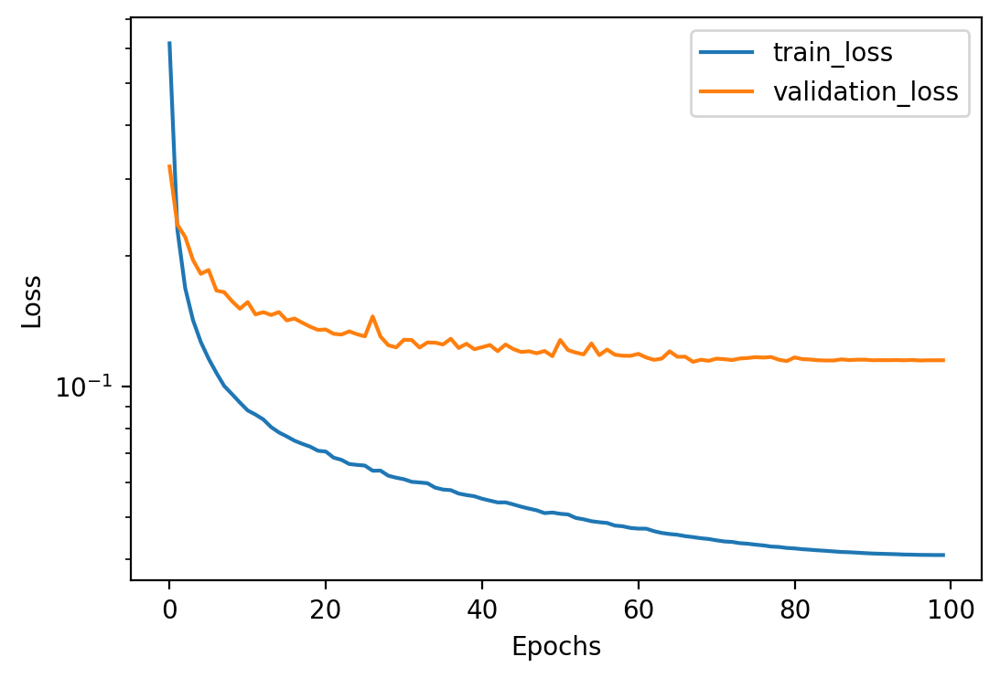

In [17]:
fig, ax = plt.subplots(figsize=(6, 4), dpi=200)
ax.plot(train_losses, label='train_loss')
ax.plot(val_losses , label='validation_loss')
plt.legend()
ax.set_yscale('log')
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
fig.show()

In [18]:
# ----------- Setup Inference Parameters -----------
sample_id = 0                  # Index of training sample to test
start_frame = 14                # Starting time step for prediction

# ----------- Extract Initial Inputs from Training Set -----------
# Get wavefield (vx, vz), and velocity model (vp, vs) for the selected sample
wavefield_seq = train_wavefield[sample_id]  # shape: (60, 64, 128, 2)
vp = train_vp[sample_id]                    # shape: (64, 128)
vs = train_vs[sample_id]                    # shape: (64, 128)

# Get the current wavefield snapshot at the prediction start time
initial_snapshot = wavefield_seq[start_frame]  # shape: (64, 128, 2)

# Construct the model input: [vx, vz, vp, vs]
# Add batch dimension and concatenate velocity fields
current_input = np.zeros((1, 64, 128, 4), dtype=np.float32)
current_input[..., :2] = initial_snapshot
current_input[..., 2] = vp
current_input[..., 3] = vs

# ----------- Perform Autoregressive Prediction -----------
predicted_frames = []

with torch.no_grad():
    for _ in range(60 - start_frame - 1):  # Predict from t=start_frame+1 to t=59
        input_tensor = torch.tensor(current_input, dtype=torch.float32).to(device)

        # Model inference
        output = model(input_tensor).cpu().numpy()  # shape: (1, 64, 128, 2)
        predicted_frames.append(output[0])          # Remove batch dimension

        # Use the output as the next input (autoregressive update)
        current_input[..., :2] = output[0]  # Update only vx, vz

# ----------- Combine Ground Truth (Before) and Prediction (After) -----------
# Final predicted sequence: true wavefield up to start_frame, then predictions
predicted_wavefield = np.concatenate((wavefield_seq[:start_frame+1], np.array(predicted_frames)), axis=0)  # shape: (60, 64, 128, 2)
plot_wavefield_video_pred_gt(predicted_wavefield[...,0], predicted_wavefield[...,1],
                     wavefield_seq[...,0], wavefield_seq[...,1], save=True, title='training_exmaple')

In [19]:
# ----------- Setup Inference Parameters -----------
sample_id = 20                  # Index of validation sample to test
start_frame = 14                # Starting time step for prediction

# ----------- Extract Initial Inputs from Validation Set -----------
# Get wavefield (vx, vz), and velocity model (vp, vs) for the selected sample
wavefield_seq = val_wavefield[sample_id]  # shape: (60, 64, 128, 2)
vp = val_vp[sample_id]                    # shape: (64, 128)
vs = val_vs[sample_id]                    # shape: (64, 128)

# Get the current wavefield snapshot at the prediction start time
initial_snapshot = wavefield_seq[start_frame]  # shape: (64, 128, 2)

# Construct the model input: [vx, vz, vp, vs]
# Add batch dimension and concatenate velocity fields
current_input = np.zeros((1, 64, 128, 4), dtype=np.float32)
current_input[..., :2] = initial_snapshot
current_input[..., 2] = vp
current_input[..., 3] = vs

# ----------- Perform Autoregressive Prediction -----------
predicted_frames = []

with torch.no_grad():
    for _ in range(60 - start_frame - 1):  # Predict from t=start_frame+1 to t=59
        input_tensor = torch.tensor(current_input, dtype=torch.float32).to(device)

        # Model inference
        output = model(input_tensor).cpu().numpy()  # shape: (1, 64, 128, 2)
        predicted_frames.append(output[0])          # Remove batch dimension

        # Use the output as the next input (autoregressive update)
        current_input[..., :2] = output[0]  # Update only vx, vz

# ----------- Combine Ground Truth (Before) and Prediction (After) -----------
# Final predicted sequence: true wavefield up to start_frame, then predictions
predicted_wavefield = np.concatenate((wavefield_seq[:start_frame+1], np.array(predicted_frames)), axis=0)  # shape: (60, 64, 128, 2)
plot_wavefield_video_pred_gt(predicted_wavefield[...,0], predicted_wavefield[...,1],
                     wavefield_seq[...,0], wavefield_seq[...,1], save=True, title='validation_exmaple')

# Make Prediction on the Test Set

In [23]:
model = torch.load("./fno4waves2d_64_128.pickle", map_location=torch.device(device), weights_only=False)

In [24]:
all_waveforms_test = glob.glob('./layered_simulation_test/*') + glob.glob('./random_field_simulation_test/*')

number_of_samples_test = len(all_waveforms_test)
print('Number of samples for test ', number_of_samples_test)
# Sort using the number extracted from the filename
all_waveforms_test = sorted(all_waveforms_test, key=lambda x: int(re.search(r'(\d+)\.npy$', x).group(1)))
all_waveforms_test

Number of samples for test  100


['./layered_simulation_test/0.npy',
 './layered_simulation_test/1.npy',
 './layered_simulation_test/2.npy',
 './layered_simulation_test/3.npy',
 './layered_simulation_test/4.npy',
 './layered_simulation_test/5.npy',
 './layered_simulation_test/6.npy',
 './layered_simulation_test/7.npy',
 './layered_simulation_test/8.npy',
 './layered_simulation_test/9.npy',
 './layered_simulation_test/10.npy',
 './layered_simulation_test/11.npy',
 './layered_simulation_test/12.npy',
 './layered_simulation_test/13.npy',
 './layered_simulation_test/14.npy',
 './layered_simulation_test/15.npy',
 './layered_simulation_test/16.npy',
 './layered_simulation_test/17.npy',
 './layered_simulation_test/18.npy',
 './layered_simulation_test/19.npy',
 './layered_simulation_test/20.npy',
 './layered_simulation_test/21.npy',
 './layered_simulation_test/22.npy',
 './layered_simulation_test/23.npy',
 './layered_simulation_test/24.npy',
 './layered_simulation_test/25.npy',
 './layered_simulation_test/26.npy',
 './layered

In [25]:
# Define grid and time dimensions
nx = 128       # number of grid points in x-direction
nz = 64        # number of grid points in z-direction
nt_test = 15        # number of time steps in each wavefield

all_wavefield_test = np.zeros((number_of_samples_test, nt_test, nz, nx, 2))

# all_vp and all_vs: shape (n_samples, nz, nx) for P-wave and S-wave velocities
all_vp_test = np.zeros((number_of_samples_test, nz, nx))
all_vs_test = np.zeros((number_of_samples_test, nz, nx))

# Loop over each saved waveform file and populate the data arrays
for i, one_wf_path in enumerate(all_waveforms_test):
    sample = np.load(one_wf_path, allow_pickle=True)  # Load .npy file as dictionary

    # Extract vx and vz wavefield components
    wavefield_vx = sample.item().get('wavefield_vx')  # shape: (nt, nz, nx)
    wavefield_vz = sample.item().get('wavefield_vz')  # shape: (nt, nz, nx)

    # Extract velocity models
    vp = sample.item().get('vp')  # shape: (nz, nx)
    vs = sample.item().get('vs')  # shape: (nz, nx)

    # Assign to preallocated arrays
    all_vp_test[i] = vp
    all_vs_test[i] = vs
    all_wavefield_test[i, :, :, :, 0] = wavefield_vx
    all_wavefield_test[i, :, :, :, 1] = wavefield_vz

all_wavefield_test = (all_wavefield_test - wavefield_mean) / wavefield_std
all_vp_test = (all_vp_test - vp_mean) / vp_std
all_vs_test = (all_vs_test - vs_mean) / vs_std

print(all_wavefield_test.shape, all_vp_test.shape, all_vs_test.shape)

(100, 15, 64, 128, 2) (100, 64, 128) (100, 64, 128)


In [42]:
# Output container: 100 samples, 45 time steps, 64×128 grid, 2 components (vx, vz)
n_samples_test = all_wavefield_test.shape[0]
nt_future = 45

# Initialize output array
all_predictions_test = np.zeros((n_samples_test, nt_future, nz, nx, 2), dtype=np.float32)

# Loop over each test sample
for sample_id in tqdm.tqdm(range(n_samples_test), desc="Predicting test set"):
    # Extract initial 15-frame wavefield and velocity model
    wavefield_seq = all_wavefield_test[sample_id]  # (15, 64, 128, 2)
    vp = all_vp_test[sample_id]                    # (64, 128)
    vs = all_vs_test[sample_id]                    # (64, 128)

    # Start autoregressive prediction from frame 14
    current_input = np.zeros((1, nz, nx, 4), dtype=np.float32)
    current_input[..., :2] = wavefield_seq[-1]     # Use last given frame as input
    current_input[..., 2] = vp
    current_input[..., 3] = vs

    # Collect predicted frames for this sample
    predicted_seq = []

    with torch.no_grad():
        for _ in range(nt_future):
            input_tensor = torch.tensor(current_input, dtype=torch.float32).to(device)
            output = model(input_tensor).cpu().numpy()  # shape: (1, 64, 128, 2)
            predicted_frame = output[0]
            predicted_seq.append(predicted_frame)
            current_input[..., :2] = predicted_frame  # update vx, vz

    # Save all predicted frames for this sample
    all_predictions_test[sample_id] = np.stack(predicted_seq, axis=0)

# Final shape: (100, 45, 64, 128, 2)
print("Prediction complete:", all_predictions_test.shape)

Predicting test set: 100%|██████████| 100/100 [00:15<00:00,  6.60it/s]

Prediction complete: (100, 45, 64, 128, 2)


In [43]:
import pandas as pd
all_predictions_test = all_predictions_test * wavefield_std + wavefield_mean
wavefield_data = all_predictions_test # shape (100, 45, 64, 128, 2)
flattened_per_sample = wavefield_data.reshape(100, -1).astype('float32')
# Create a DataFrame and save to CSV
df = pd.DataFrame(flattened_per_sample).T
df.insert(0, 'ID', np.arange(len(df)))
df.to_csv("wavefield_predictions.csv", index=False)

In [44]:
sample_2_show = 55
first_few_frames = all_wavefield_test[sample_2_show] * wavefield_std + wavefield_mean
pred_frames = all_predictions_test[sample_2_show]
all_frames = np.concatenate((first_few_frames, pred_frames), axis=0)
plot_wavefield_video(all_frames[...,0], all_frames[...,1], save=True, title='test')